In [2]:
#TRATAMIENTO DE DATOS
import pandas as pd
import numpy as np
import math
#GRÁFICOS
import matplotlib.pyplot as plt
import seaborn as sb
from yellowbrick.cluster import SilhouetteVisualizer
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Tahoma', 'DejaVu Sans', 'DejaVuSerif']
from scipy.cluster.hierarchy import dendrogram
import plotly.express as px
#PREPARACIÓN DE DATOS
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn import set_config
#MODELADO
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from itertools import product
#EVALUACIÓN
from sklearn.metrics import silhouette_score
#ADVERTENCIAS
import warnings
warnings.filterwarnings('ignore')

In [3]:
datos = pd.read_csv('datos_caso_2.csv', sep=',')
datos.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [4]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [5]:
datos.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [6]:
datos.isna().sum() # verificación de nulos, hay nulos pero son menos de el 10% de los datos se porcede a eliminar los datos

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [7]:
datos.dropna(inplace = True) #eliminamos las rows con datos nulos

In [8]:
datos.isna().sum() # verificamos

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [9]:
columns_numeric =  datos.select_dtypes(include=['float64','int64']).columns.to_list()
columns_categoric = ['CUST_ID']# en verdad no se debería usar, ya que es un identificador del cliente no aporta nada al modelo
cords = [[0,0],[0,1],[0,2],[1,0],[1,1],[1,2]]

In [10]:
len(columns_numeric)

17

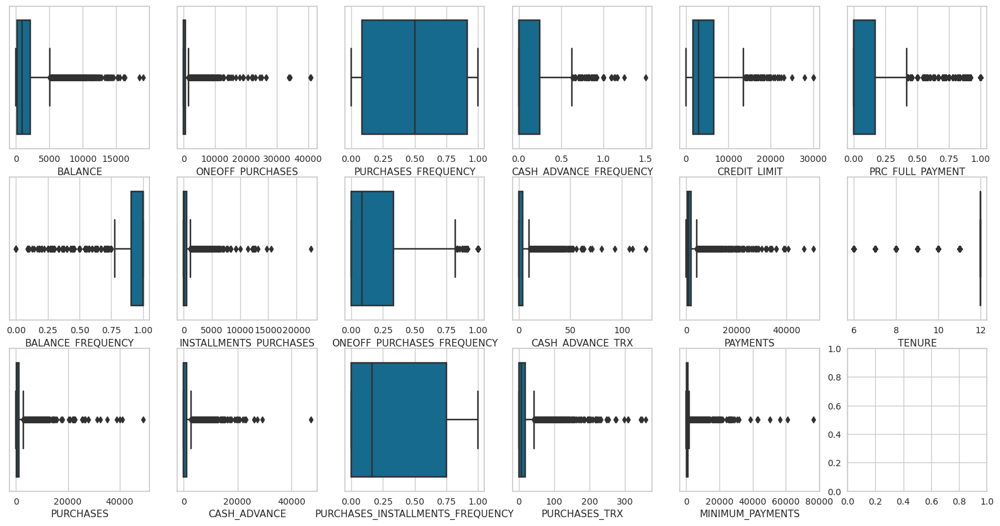

In [11]:
# para graficar todas las variables como cajas y bigotes
fig, ax = plt.subplots(3, 6, figsize=(20, 10))

for i in range(len(columns_numeric)):
    # sb.boxplot(data=datos, x=columns_numeric[i], ax=ax[cords[i%3][i//3],cords[i][1]] )
    sb.boxplot(data=datos, x=columns_numeric[i], ax=ax[i%3,i//3])

plt.show()

(array([2629.,  468.,  395.,  370.,  323.,  751.,  342.,  327.,  463.,
        2568.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

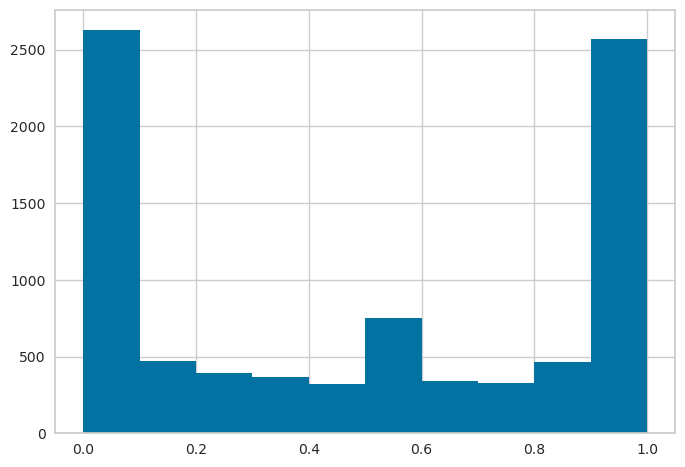

In [12]:
plt.hist(x=datos["PURCHASES_FREQUENCY"])

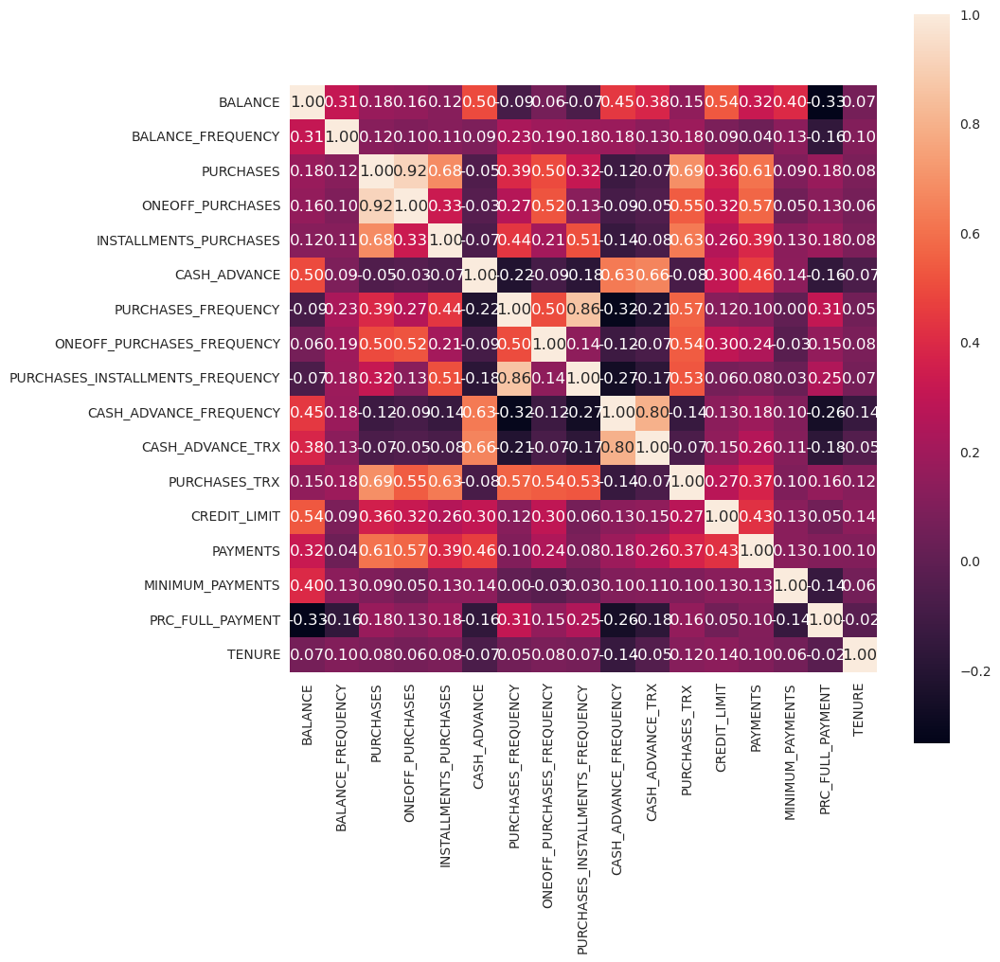

In [13]:
plt.subplots(figsize=(10,10))
sb.heatmap(datos.corr(numeric_only=True), annot=True, square = True,fmt = '.2f', )
plt.show()

In [14]:
# Separación de variables caegoricas y numéricas
numCols = datos.select_dtypes(include=['float64','int64']).columns.to_list()


# Crear los transformadores de variables
numTransformer = Pipeline(steps=[('scaler', MinMaxScaler())])


# Diseñar el transformador de columnas
preprocesador = ColumnTransformer(transformers=[
    ('num', numTransformer, numCols),
    ]
    , remainder='passthrough')

set_config(display='diagram')
preprocesador

ColumnTransformer(remainder='passthrough',
                  transformers=[('num',
                                 Pipeline(steps=[('scaler', MinMaxScaler())]),
                                 ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
                                  'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES',
                                  'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
                                  'ONEOFF_PURCHASES_FREQUENCY',
                                  'PURCHASES_INSTALLMENTS_FREQUENCY',
                                  'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX',
                                  'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
                                  'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
                                  'TENURE'])])

In [15]:
datos = datos.drop('CUST_ID', axis = 1)

In [16]:
datosPre = preprocesador.fit_transform(datos)
labels = numCols
datosPro = pd.DataFrame(datosPre, columns=labels)
datosPro.head(10)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.002148,0.818182,0.001945,0.000000,0.004240,0.000000,0.166667,0.000000,0.083333,0.000000,0.00000,0.005587,0.031720,0.003978,0.001826,0.000000,1.0
1,0.168169,0.909091,0.000000,0.000000,0.000000,0.136685,0.000000,0.000000,0.000000,0.166667,0.03252,0.000000,0.232053,0.080892,0.014034,0.222222,1.0
2,0.131026,1.000000,0.015766,0.018968,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.00000,0.033520,0.248748,0.012263,0.008210,0.000000,1.0
3,0.042940,1.000000,0.000326,0.000393,0.000000,0.000000,0.083333,0.083333,0.000000,0.000000,0.00000,0.002793,0.038397,0.013373,0.003204,0.000000,1.0
4,0.095038,1.000000,0.027188,0.000000,0.059257,0.000000,0.666667,0.000000,0.583333,0.000000,0.00000,0.022346,0.058431,0.027602,0.031506,0.000000,1.0
5,0.032939,1.000000,0.144598,0.157076,0.030595,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.178771,0.449082,0.125278,0.002592,1.000000,1.0
6,0.095764,1.000000,0.008895,0.000000,0.019387,0.000000,1.000000,0.000000,1.000000,0.000000,0.00000,0.033520,0.075125,0.013387,0.006963,0.000000,1.0
7,0.053296,1.000000,0.017567,0.016228,0.008889,0.000000,0.333333,0.083333,0.250000,0.000000,0.00000,0.013966,0.232053,0.013569,0.004083,0.000000,1.0
8,0.007994,0.545455,0.026134,0.031442,0.000000,0.000000,0.166667,0.166667,0.000000,0.000000,0.00000,0.008380,0.365609,0.022963,0.001312,0.000000,1.0
9,0.067905,1.000000,0.018763,0.000000,0.040894,0.000000,1.000000,0.000000,1.000000,0.000000,0.00000,0.033520,0.038397,0.021357,0.028436,0.000000,1.0


In [17]:
datosPro.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,0.084084,0.895035,0.020910,0.014840,0.018704,0.021091,0.496000,0.205909,0.368820,0.091736,0.026942,0.041992,0.149319,0.035181,0.011312,0.159304,0.922398
std,0.110043,0.207697,0.044191,0.041321,0.040766,0.045006,0.401273,0.300054,0.398093,0.134528,0.056199,0.070337,0.122178,0.057368,0.031052,0.296271,0.218497
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.007777,0.909091,0.000884,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,0.002793,0.051753,0.008251,0.002214,0.000000,1.000000
50%,0.048146,1.000000,0.007655,0.001104,0.004213,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,0.019553,0.098497,0.017677,0.004089,0.000000,1.000000
75%,0.110549,1.000000,0.023368,0.014698,0.021518,0.024023,0.916667,0.333333,0.750000,0.166667,0.032520,0.050279,0.215359,0.038467,0.010804,0.166667,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [18]:
datosPro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8636 entries, 0 to 8635
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8636 non-null   float64
 1   BALANCE_FREQUENCY                 8636 non-null   float64
 2   PURCHASES                         8636 non-null   float64
 3   ONEOFF_PURCHASES                  8636 non-null   float64
 4   INSTALLMENTS_PURCHASES            8636 non-null   float64
 5   CASH_ADVANCE                      8636 non-null   float64
 6   PURCHASES_FREQUENCY               8636 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8636 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8636 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8636 non-null   float64
 10  CASH_ADVANCE_TRX                  8636 non-null   float64
 11  PURCHASES_TRX                     8636 non-null   float64
 12  CREDIT

In [19]:
datosPro.isna().sum() # verificación de nulos, hay nulos pero son menos de el 10% de los datos se porcede a eliminar los datos

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

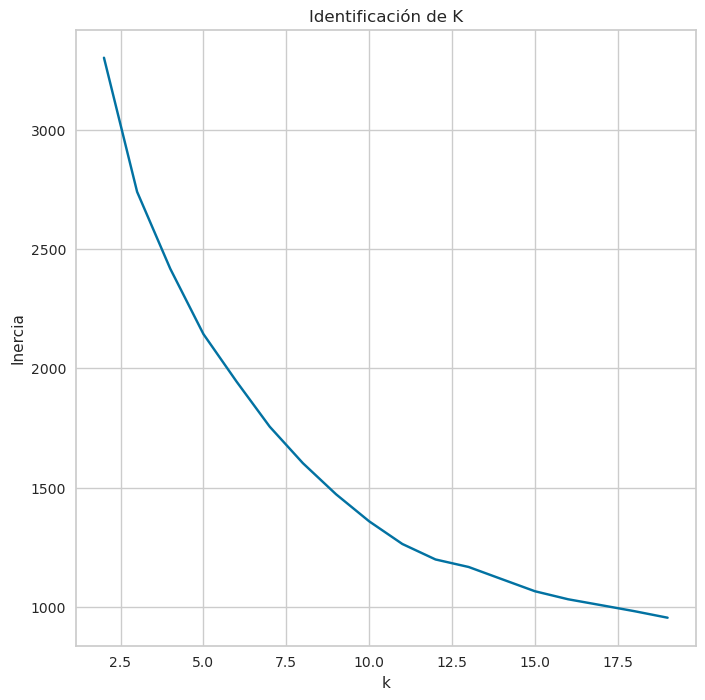

In [20]:
# Metodo del codo (Inercia)
sumDistancia =[]
K = range(2,20)
for k in K:
    km = KMeans(n_clusters=k, random_state=123)
    km = km.fit(datosPro)
    sumDistancia.append(km.inertia_)
plt.figure(figsize=(8,8))
plt.plot(K, sumDistancia, 'bx-')
plt.title('Identificación de K')
plt.xlabel('k')
plt.ylabel('Inercia')
plt.show()

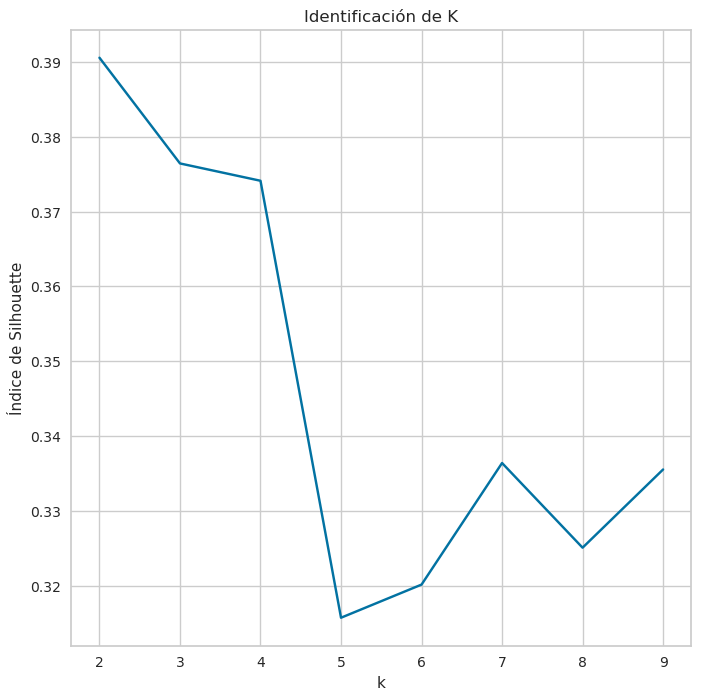

In [21]:
numeroCluster = range (2,10) # número de grupos 2
valoresIndice = []

for n_cluster in numeroCluster:
    modeloKmeans = KMeans(n_clusters=n_cluster, random_state=123)
    labels = modeloKmeans.fit_predict(datosPro)
    mediaSilueta = silhouette_score(datosPro, labels)
    valoresIndice.append(mediaSilueta)
plt.figure(figsize=(8,8))
plt.plot(numeroCluster, valoresIndice, 'bx-')
plt.title('Identificación de K')
plt.xlabel('k')
plt.ylabel('Índice de Silhouette')
plt.show()

In [22]:
modelo_final = KMeans(n_clusters = 2, random_state=123, n_init=25) #n_clusters from codo o silhouette, random state seed, n_init to start with better seed
modelo_final.fit(datosPro)
grupos = modelo_final.predict(datosPro)
datosGrupos = datos
datosGrupos['Grupo KMeans'] = grupos
datosGrupos

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Grupo KMeans
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,1
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


In [23]:
centros = pd.DataFrame(modelo_final.cluster_centers_)
centros.columns = numCols
centros

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.074517,0.945339,0.037798,0.024873,0.03734,0.012186,0.892863,0.338219,0.728355,0.052136,0.016034,0.081256,0.164321,0.041387,0.011543,0.260162,0.933637
1,0.092141,0.852672,0.006688,0.006391,0.00301,0.028590,0.161782,0.094483,0.066038,0.125085,0.036129,0.008926,0.136684,0.029954,0.011117,0.074366,0.912934


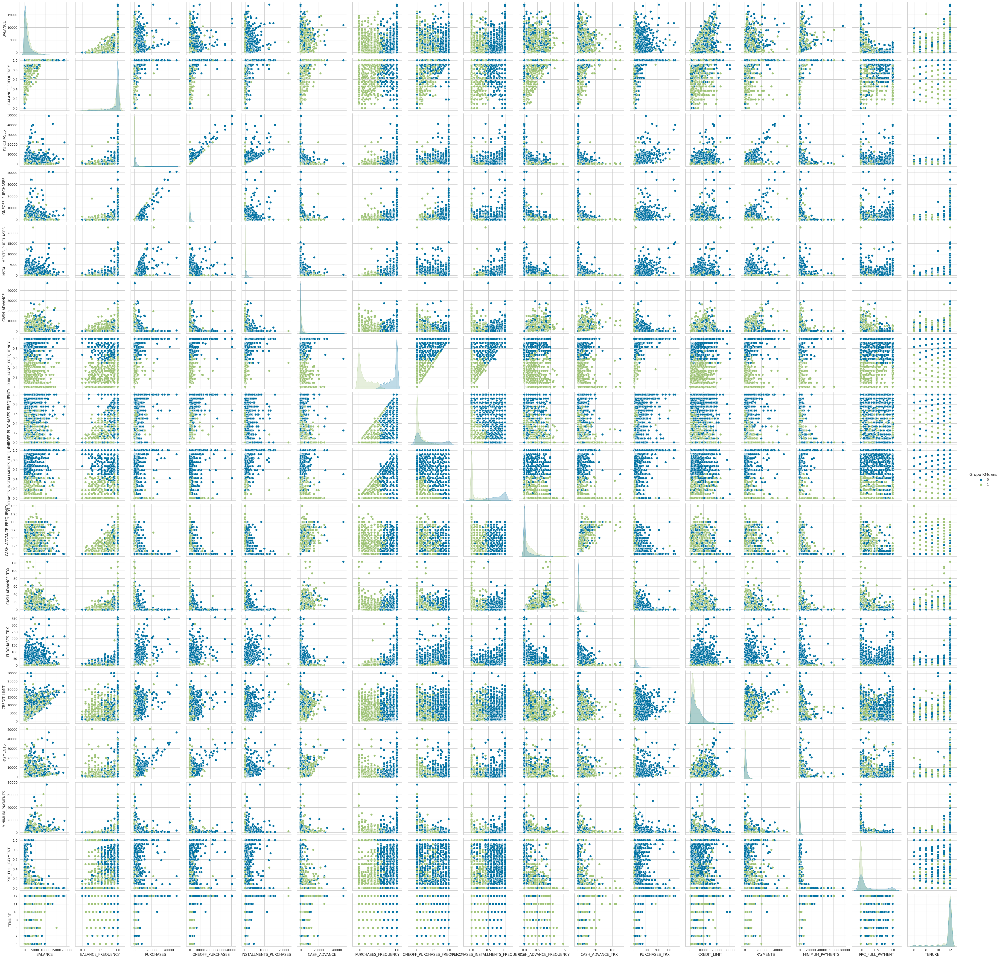

In [25]:
img = sb.pairplot(data = datosGrupos, hue = 'Grupo KMeans')
plt.show()
# img.savefig('output_plot.svg', format='svg')
# img.savefig('output_plot.png', format='png')


In [ ]:
# img.savefig('output_plot.svg', format='svg')
# img.savefig('output_plot.png', format='png')

In [ ]:
numInverseTransformer = preprocesador.named_transformers_['num']['scaler']
centNumInvTrans = numInverseTransformer.inverse_transform(centros[numCols])

In [ ]:
centros_transformados = pd.DataFrame(centNumInvTrans,columns = numCols)
centros_transformados
sb.pairplot(data = centros_transformados, hue = 'Grupo KMeans')
plt.show()
plt.savefig('output_plot.svg', format='svg')
plt.savefig('output_plot.png', format='png')

KeyError: 'Grupo KMeans'

Error in callback <function flush_figures at 0x7f0310797ce0> (for post_execute):


KeyboardInterrupt: 

In [ ]:
#Funcion para dibujar un dendograma
def dibujar_dendograma(model, **kwargs):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)

    #Plot
    dendrogram(linkage_matrix, **kwargs)

In [ ]:
cluster_ward = AgglomerativeClustering(affinity = 'euclidean',
                                       linkage = 'ward',
                                       n_clusters = None,
                                       distance_threshold =0)
cluster_ward.fit(datosPro)

AgglomerativeClustering(affinity='euclidean', distance_threshold=0,
                        n_clusters=None)

<function matplotlib.pyplot.show(close=None, block=None)>

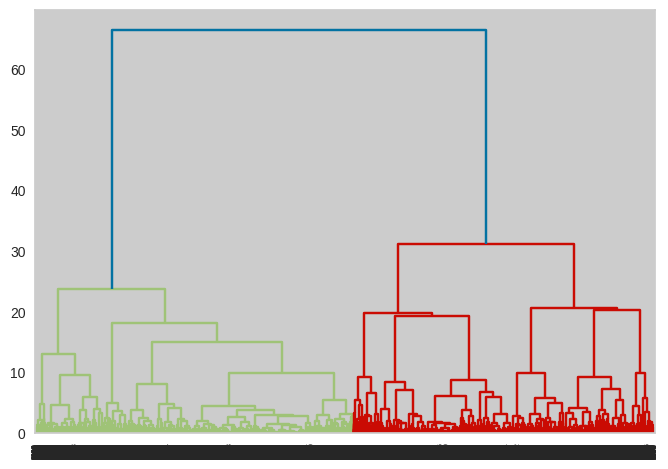

In [ ]:
dibujar_dendograma(cluster_ward)# dendograma recomienda dos grupos, desde la zona visual se ve claramente
plt.show

In [ ]:
modelo_final_jerarquico = AgglomerativeClustering(affinity = 'euclidean',
                                                  linkage = 'ward',
                                                  n_clusters = 2)
modelo_final_jerarquico.fit(datosPro)
labels = modelo_final_jerarquico.labels_
datosGrupos['Grupos Jerarquicos'] = labels
datosGrupos

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Grupo KMeans,Grupos Jerarquicos
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1,1
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,1,1
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0,0
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0,0
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1,1


In [ ]:
datosGrupos['Grupos Jerarquicos'].value_counts()

1    4435
0    4201
Name: Grupos Jerarquicos, dtype: int64

In [ ]:
datosGrupos['Grupo KMeans'].value_counts()

1    4689
0    3947
Name: Grupo KMeans, dtype: int64

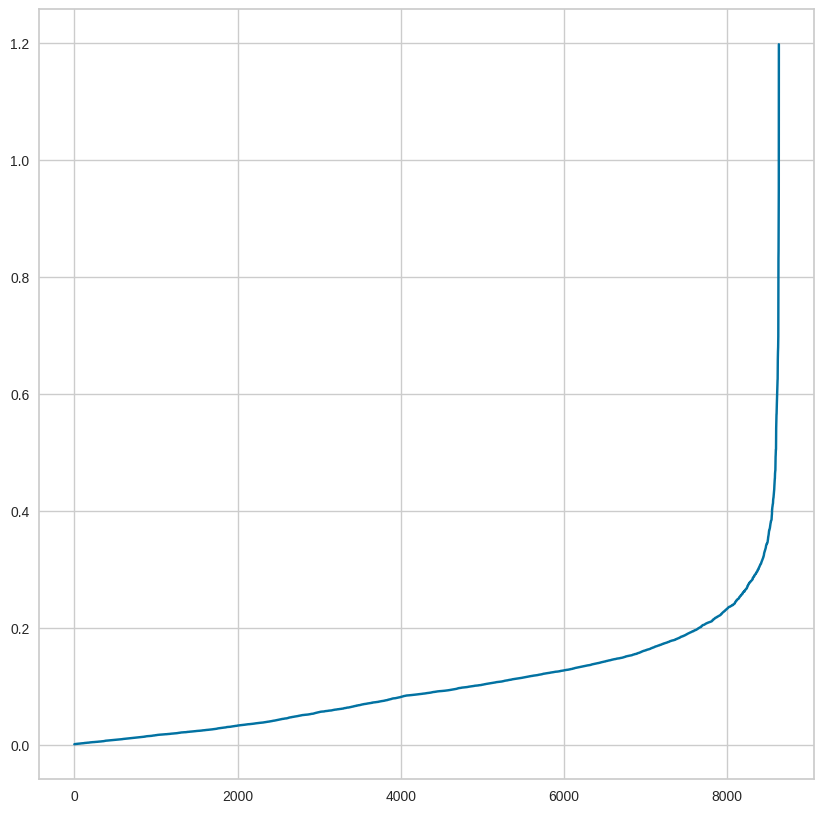

In [ ]:
from sklearn import neighbors
#identificar el rango de distancias para epsilon
neighbors = NearestNeighbors(n_neighbors = 3)
neighbors_fit = neighbors.fit(datosPro)
distances, indice = neighbors_fit.kneighbors(datosPro)
distances = np.sort(distances, axis = 0)
distances = distances[:,1]
plt.figure(figsize = (10, 10))
plt.plot(distances)
plt.show()

In [ ]:
valores_eps = np.arange(0.35, 1.2, 0.1)
min_muestras = np.arange(2, 10)
parametros = list(product(valores_eps, min_muestras))
sil_score = []
for p in parametros:
  y_pred = DBSCAN(eps = p[0], min_samples = p[1]).fit_predict(datosPro)
  sil_score.append(silhouette_score(datosPro, y_pred))

<function matplotlib.pyplot.show(close=None, block=None)>

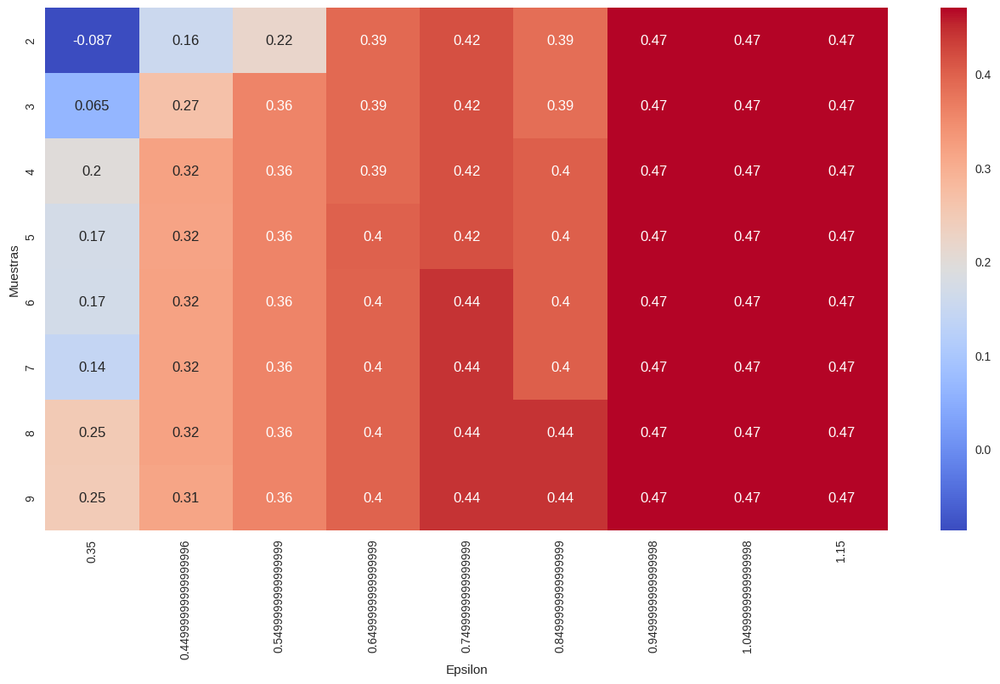

In [ ]:
df_ajuste_parametros = pd.DataFrame.from_records(parametros, columns = ['Epsilon', 'Muestras'])
df_ajuste_parametros['Score'] = sil_score
datos_cruzados = pd.pivot_table(df_ajuste_parametros, values = 'Score', index = 'Muestras', columns = 'Epsilon')
plt.figure(figsize = (16,8))
sb.heatmap(datos_cruzados, annot = True, fmt = '.2g', cmap = 'coolwarm')
plt.show

In [ ]:
modelo_final_dbscan = DBSCAN(eps = 1.15, min_samples = 3)
grupos = modelo_final_dbscan.fit_predict(datosPro)
datosGrupos['Grupo DBSCAN'] = grupos
datosGrupos

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Grupo KMeans,Grupos Jerarquicos,Grupo DBSCAN
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1,1,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1,1,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0,0,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1,1,0
5,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.0,1400.057770,2407.246035,0.000000,12,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8943,5.871712,0.500000,20.90,20.90,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,1,500.0,58.644883,43.473717,0.000000,6,1,1,0
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0,0,0
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0,0,0
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1,1,0


In [ ]:
datosGrupos['Grupo DBSCAN'].value_counts()

 0    8635
-1       1
Name: Grupo DBSCAN, dtype: int64

In [ ]:
indice_k = silhouette_score(datosPro, modelo_final.predict(datosPro))
indice_jerarquico = silhouette_score(datosPro, modelo_final_jerarquico.fit_predict(datosPro))
indice_dbscan = silhouette_score(datosPro, modelo_final_dbscan.fit_predict(datosPro))

In [ ]:
print(f'El indice de silhouette para el metodo kmeans es {indice_k}')
print(f'El indice de silhouette para el metodo Jerarquico es {indice_jerarquico}')
print(f'El indice de silhouette para el metodo DBSCAN es {indice_dbscan}')

El indice de silhouette para el metodo kmeans es 0.3905501972265014
El indice de silhouette para el metodo Jerarquico es 0.36625269940159266
El indice de silhouette para el metodo DBSCAN es 0.4700520604891176


### Distribución de variables Por Grupo

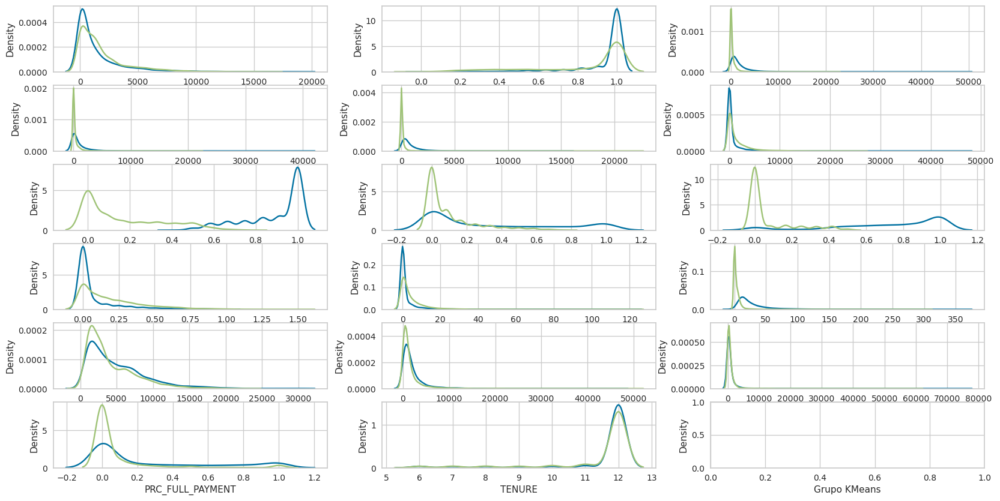

In [72]:
# sb.kdeplot(data=datosGrupos.loc['ONEOFF_PURCHASES', 'Grupo KMeans'], hue="Grupo KMeans")
# sb.kdeplot(data=datosGrupos[datosGrupos['Grupo KMeans'] == 0]["PURCHASES_TRX"])
# sb.kdeplot(data=datosGrupos[datosGrupos['Grupo KMeans'] == 1]["PURCHASES_TRX"])

fig, ax = plt.subplots(6, 3, figsize=(20, 10))

for i in range(len(datosGrupos.columns)):
    # sb.boxplot(data=datos, x=columns_numeric[i], ax=ax[cords[i%3][i//3],cords[i][1]] )
    sb.kdeplot(data=datosGrupos[datosGrupos['Grupo KMeans'] == 0][datos.columns[i]], ax=ax[i//3,i%3])
    sb.kdeplot(data=datosGrupos[datosGrupos['Grupo KMeans'] == 1][datos.columns[i]], ax=ax[i//3,i%3])
